In [36]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import os
import re
from collections import Counter
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import accuracy_score, confusion_matrix
from tqdm import tqdm
from sklearn.utils import resample
from nltk.corpus import stopwords
from sklearn.model_selection import train_test_split

# nltk.download('vader_lexicon')
# nltk.download('stopwords')
# from sklearn import preprocessing

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
import sys

# nltk.download('punkt_tab')

In [37]:
is_cuda = torch.cuda.is_available()

if is_cuda:
    device = torch.device("cuda")
else:
    device = torch.device("cpu")

print(is_cuda)

True


In [39]:
def get_train_test(balance):
    cwd = os.getcwd()
    # print(cwd)

    df_train = pd.read_csv(cwd + "\data\drugsComTrain_raw.tsv", sep='\t')
    df_test = pd.read_csv(cwd + "\data\drugsComTest_raw.tsv", sep='\t')

    df_list = [df_train, df_test]

    # print(f"train_len={train_len} test_len={test_len} df_len={len(df)}")
    print(df_train.columns)

    df_train['drugName'] = df_train['drugName'].str.upper()
    number_of_drugs = len(df_train['drugName'].unique())
    print(f"Number of drugs = {number_of_drugs}")

    df_train['condition'] = df_train['condition'].str.upper()
    number_of_drugs = len(df_train['condition'].unique())
    print(f"Number of condition = {number_of_drugs}")

    # Generate columns for review length and positive reviews.  If the rating is greater than 7 of 10, assume it is positive
    for df in df_list:
        df['review_len'] = df['review'].str.len()
        df['is_positive'] = np.where(df['rating'] > 7, 1, 0)

    if balance:
        df_train = balance_class(df_train, 'is_positive')
        df_test = balance_class(df_test, 'is_positive')
    return df_train, df_test

def balance_class(df, colname):
    class1 = df[df[colname] == 1].copy()
    class2 = df[df[colname] == 0].copy()

    if len(class1) > len(class2):
        maj_class = class1
        min_class = class2
    else:
        maj_class = class2
        min_class = class1 

    maj_downsample = resample(maj_class, replace=False, n_samples=len(min_class), random_state=0)

    df_balanced = pd.concat([min_class, maj_downsample])
    return df_balanced

In [45]:
df_test, df_train = get_train_test(balance=True)


Index(['Unnamed: 0', 'drugName', 'condition', 'review', 'rating', 'date',
       'usefulCount'],
      dtype='object')
Number of drugs = 3436
Number of condition = 885


In [46]:
def clean_text(text):
    # Remove punctuation
    cleaned_text = re.sub(r'[^\w\s]', '', text)
    # Remove extra whitespace
    cleaned_text = re.sub(r"\s+", '', cleaned_text)
    # Remove digits
    cleaned_text = re.sub(r"\d", '', cleaned_text)
    return cleaned_text

# Set column to loser case
df_train['review'] = df_train['review'].str.lower()
df_test['review'] = df_test['review'].str.lower()

# Get stop words from NLTK
stop_words = set(stopwords.words('english'))

word_list = []
# Concat all rows to single line
all_lines = df_train['review'].str.cat()
for word in all_lines.split():
    # Clean words
    word = clean_text(word)
    # If word not a stop word or removed in cleaning
    if word not in stop_words and word != '':
        # Add to list of words
        word_list.append(word)

# Get the 10,000 most common words
corpus = Counter(word_list).most_common(10000)

# Create a dictonary with the being the key and value being the rank, 1 being most common word
oh_dict = {}
for word_count, word in enumerate(corpus):
    oh_dict[word[0]] = word_count + 1

word_list_train = []
word_list_test = []

for line in df_train['review']:
    line_tokens = []
    for word in line.split():
       if clean_text(word) in oh_dict.keys():
            line_tokens.append(oh_dict[clean_text(word)])
    word_list_train.append(line_tokens)

for line in df_test['review']:
    line_tokens = []
    for word in line.split():
       if clean_text(word) in oh_dict.keys():
            line_tokens.append(oh_dict[clean_text(word)])
    word_list_test.append(line_tokens)

In [47]:
word_len = []
for i in word_list_train:
    word_len.append(len(i))

for i in word_list_test:
    word_len.append(len(i))

# Get padding ceiling by taking length of 99.99%th percentile and rounding up to the nearest 100
padding_ceil = int(np.ceil(pd.Series(word_len).quantile(.9999)/100)*100)

print(f"padding_ceil={padding_ceil}")

x_train_padded = np.zeros((len(word_list_train), padding_ceil), dtype=int)
x_test_padded = np.zeros((len(word_list_test), padding_ceil), dtype=int)

for i in range(len(word_list_train)):
    if len(word_list_train[i]) > padding_ceil:
        x_train_padded[i] = np.array(word_list_train[i][:padding_ceil])
    else:
        x_train_padded[i] = np.array(list(nltk.pad_sequence(word_list_train[i], padding_ceil + 1 - len(word_list_train[i]), pad_left=True, left_pad_symbol=0)))

for i in range(len(word_list_test)):
    if len(word_list_test[i]) > padding_ceil:
        word_list_test[i] = np.array(word_list_test[i][:padding_ceil])
    else:
        word_list_test[i] = np.array(list(nltk.pad_sequence(word_list_test[i], padding_ceil + 1 - len(word_list_test[i]), pad_left=True, left_pad_symbol=0)))

y_train = np.array(df_train['is_positive'])
y_test = np.array(df_test['is_positive'])

print(f"y_train.mean()={y_train.mean():.5f}")
print(f"y_test.mean()={y_test.mean():.5f}")


padding_ceil=300
y_train.mean()=0.50000
y_test.mean()=0.50000


Sample input size:  torch.Size([1000, 300])
Sample input: 
 tensor([[   0,    0,    0,  ...,  959,   84,  367],
        [   0,    0,    0,  ...,  208,  184,  571],
        [   0,    0,    0,  ..., 3734,  167,  556],
        ...,
        [   0,    0,    0,  ...,  325,  690,  183],
        [   0,    0,    0,  ...,  994, 1420,  236],
        [   0,    0,    0,  ...,  164,    4,   14]], dtype=torch.int32)
Sample output: 
 tensor([0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0, 1,
        1, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0,
        0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1,
        1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 1, 1, 1, 0, 0,
        0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0,
        1, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0,
        0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0,
        1, 0, 1, 1

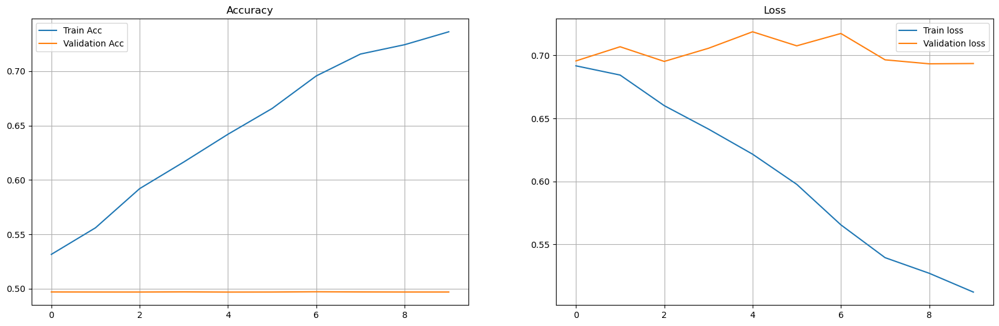

In [ ]:
# https://www.datacamp.com/datalab/w/7d7782db-69f5-4d47-bad0-03e758897ef3
# https://www.datacamp.com/tutorial/nlp-with-pytorch-a-comprehensive-guide

# create Tensor datasets
train_data = TensorDataset(torch.from_numpy(x_train_padded), torch.from_numpy(y_train))
test_data = TensorDataset(torch.from_numpy(x_test_padded), torch.from_numpy(y_test))

# train_data = TensorDataset(torch.from_numpy(y_train), torch.from_numpy(y_train))
# valid_data = TensorDataset(torch.from_numpy(y_test), torch.from_numpy(y_test))

# dataloaders
batch_size = 1000

# make sure to SHUFFLE your data
train_loader = DataLoader(train_data, shuffle=True, batch_size=batch_size, drop_last=True)
test_loader = DataLoader(test_data, shuffle=True, batch_size=batch_size, drop_last=True)

# obtain one batch of training data
dataiter = iter(train_loader)
sample_x, sample_y = next(dataiter)

print('Sample input size: ', sample_x.size()) # batch_size, seq_length
print('Sample input: \n', sample_x)
print('Sample output: \n', sample_y)

class SentimentRNN(nn.Module):
    def __init__(self,no_layers,vocab_size,hidden_dim,embedding_dim,drop_prob=0.5):
        super(SentimentRNN,self).__init__()
 
        self.output_dim = output_dim
        self.hidden_dim = hidden_dim
 
        self.no_layers = no_layers
        self.vocab_size = vocab_size
   
        # embedding and LSTM layers
        self.embedding = nn.Embedding(vocab_size, embedding_dim)
       
        #lstm
        self.lstm = nn.LSTM(input_size=embedding_dim,hidden_size=self.hidden_dim,
                           num_layers=no_layers, batch_first=True)
       
        # dropout layer
        self.dropout = nn.Dropout(0.3)
   
        # linear and sigmoid layer
        self.fc = nn.Linear(self.hidden_dim, output_dim)
        self.sig = nn.Sigmoid()
       
    def forward(self,x,hidden):
        batch_size = x.size(0)
        # embeddings and lstm_out
        embeds = self.embedding(x)  # shape: B x S x Feature   since batch = True
        # print(embeds.shape)  #[50, 500, 1000]
        try:
            # print(embeds.shape)
            # sys.exit()
            lstm_out, hidden = self.lstm(embeds, hidden)
        except:
            print(embeds.shape)
            sys.exit()
       
        lstm_out = lstm_out.contiguous().view(-1, self.hidden_dim)
       
        # dropout and fully connected layer
        out = self.dropout(lstm_out)
        out = self.fc(out)
       
        # sigmoid function
        sig_out = self.sig(out)
       
        # reshape to be batch_size first
        sig_out = sig_out.view(batch_size, -1)


        sig_out = sig_out[:, -1] # get last batch of labels
       
        # return last sigmoid output and hidden state
        return sig_out, hidden
       
    def init_hidden(self, batch_size):
        ''' Initializes hidden state '''
        # Create two new tensors with sizes n_layers x batch_size x hidden_dim,
        # initialized to zero, for hidden state and cell state of LSTM
        h0 = torch.zeros((self.no_layers,batch_size,self.hidden_dim)).to(device)
        c0 = torch.zeros((self.no_layers,batch_size,self.hidden_dim)).to(device)
        hidden = (h0,c0)
        return hidden 
    
no_layers = 2
vocab_size = len(oh_dict) + 1 #extra 1 for padding
embedding_dim = 64
output_dim = 1
hidden_dim = 256

print(f"no_layers={no_layers},vocab_size={vocab_size},hidden_dim={hidden_dim},embedding_dim={embedding_dim}")

model = SentimentRNN(no_layers,vocab_size,hidden_dim,embedding_dim,drop_prob=0.5)

#moving to gpu
model.to(device)
print(model)

# loss and optimization functions

lr=0.0001
criterion = nn.BCELoss()

optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# function to predict accuracy
def acc(pred,label):
    pred = torch.round(pred.squeeze())
    return torch.sum(pred == label.squeeze()).item()

clip = 5
epochs = 10
valid_loss_min = np.Inf
# train for some number of epochs
epoch_tr_loss,epoch_vl_loss = [],[]
epoch_tr_acc,epoch_vl_acc = [],[]


for epoch in range(epochs):
    train_losses = []
    train_acc = 0.0
    model.train()
    # initialize hidden state
    h = model.init_hidden(batch_size)
    for inputs, labels in train_loader:
       
        inputs, labels = inputs.to(device), labels.to(device)  
        # Creating new variables for the hidden state, otherwise
        # we'd backprop through the entire training history
        h = tuple([each.data for each in h])
       
        model.zero_grad()
        output,h = model(inputs,h)
       
        # calculate the loss and perform backprop
        loss = criterion(output.squeeze(), labels.float())
        loss.backward()
        train_losses.append(loss.item())
        # calculating accuracy
        accuracy = acc(output,labels)
        train_acc += accuracy
        #`clip_grad_norm` helps prevent the exploding gradient problem in RNNs / LSTMs.
        nn.utils.clip_grad_norm_(model.parameters(), clip)
        optimizer.step()
       
    val_h = model.init_hidden(batch_size)
    val_losses = []
    val_acc = 0.0
    model.eval()
    for inputs, labels in test_loader:
            val_h = tuple([each.data for each in val_h])
            inputs, labels = inputs.to(device), labels.to(device)
            output, val_h = model(inputs, val_h)
            # print(output)
            val_loss = criterion(output.squeeze(), labels.float())
            val_losses.append(val_loss.item())     
            accuracy = acc(output,labels)
            val_acc += accuracy
           
    epoch_train_loss = np.mean(train_losses)
    epoch_val_loss = np.mean(val_losses)
    epoch_train_acc = train_acc/len(train_loader.dataset)
    epoch_val_acc = val_acc/len(test_loader.dataset)
    epoch_tr_loss.append(epoch_train_loss)
    epoch_vl_loss.append(epoch_val_loss)
    epoch_tr_acc.append(epoch_train_acc)
    epoch_vl_acc.append(epoch_val_acc)
    print(f'Epoch {epoch+1}')
    print(f'train_loss : {epoch_train_loss} val_loss : {epoch_val_loss}')
    print(f'train_accuracy : {epoch_train_acc*100} val_accuracy : {epoch_val_acc*100}')
    if epoch_val_loss <= valid_loss_min:
        torch.save(model.state_dict(), 'state_dict.pt')
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(valid_loss_min,epoch_val_loss))
        valid_loss_min = epoch_val_loss
    print(25*'==')

fig = plt.figure(figsize = (20, 6))
plt.subplot(1, 2, 1)
plt.plot(epoch_tr_acc, label='Train Acc')
plt.plot(epoch_vl_acc, label='Validation Acc')
plt.title("Accuracy")
plt.legend()
plt.grid()
   
plt.subplot(1, 2, 2)
plt.plot(epoch_tr_loss, label='Train loss')
plt.plot(epoch_vl_loss, label='Validation loss')
plt.title("Loss")
plt.legend()
plt.grid()


plt.show()

# Cleanup
del model
del optimizer
gc.collect()
torch.cuda.empty_cache()